# Генерация лиц аниме-персонажей с помощью WGAN-GP

Цель проекта: Реализация и обучение усовершенствованной генеративно-состязательной сети (Wasserstein GAN with Gradient Penalty) для стабильной генерации высококачественных изображений лиц аниме-персонажей.

Ключевые аспекты:

Практическое применение теории WGAN и Gradient Penalty для решения проблем классических GAN (исчезающие градиенты, коллапс мод).

Работа с PyTorch, включая создание кастомных архитектур, функций потерь и цикла обучения.

Визуализация процесса обучения и анализ результатов.

## Импорт библиотек и настройка среды

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid

# Visualization & Utilities
import matplotlib.pyplot as plt
import numpy as np
from tqdm.notebook import tqdm  # Для красивого прогресс-бара в Jupyter
import os
from PIL import Image

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


### Загрузка и подготовка датасета Anime Face Dataset

Для обучения модели используется датасет Anime Face Dataset, содержащий более 63 тысяч изображений лиц аниме-персонажей размером 64x64 пикселя. Мы создаем DataLoader с применением аугментаций (изменение размера, нормализация), которые подготавливают данные для нейросети.



In [3]:
DATA_PATH = "datasets/anime_faces"
IMG_SIZE = 64
BATCH_SIZE = 64

In [4]:
# Загрузка Anime Faces Dataset
def prepare_dataset(data_path, img_size=64, batch_size=64):
    """
    Создает DataLoader для Anime Face Dataset.

    Args:
        data_path: Путь к папке с данными.
        img_size: Целевой размер изображения (квадрат).
        batch_size: Размер батча для обучения.

    Returns:
        DataLoader: Загрузчик данных для итеративного использования.
    """

    # Определяем преобразования: изменение размера, конвертация в тензор, нормализация
    transform = transforms.Compose([
        transforms.Resize((img_size, img_size)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ])

    dataset = datasets.ImageFolder(root=data_path, transform=transform)
    dataloader = DataLoader(dataset, batch_size=batch_size, num_workers=4, shuffle=True)
    return dataloader

In [5]:
dataloader = prepare_dataset(DATA_PATH, IMG_SIZE, BATCH_SIZE)

## Визуализация образцов данных

In [6]:
def visualize_real_samples(dataloader, device, num_samples=64):
    """
    Визуализирует батч реальных изображений из датасета.

    Arhs:
        dataloader: DataLoader с тренировочными данными.
        device: Устройство (CPU/GPU).
        num_samples: Количество изображений для визуализации.
    """
    # Получаем один батч данных
    real_batch, _ = next(iter(dataloader))
    real_batch = real_batch.to(device)

    # Подготавливаем сетку изображений
    # normalize=True меняет диапазон [-1, 1] обратно на [0, 1] для корректного отображения
    grid = make_grid(real_batch[:num_samples], nrow=8, padding=2, normalize=True)

    # Преобразуем тензор в формат для matplotlib (C, H, W) -> (H, W, C)
    grid_np = grid.cpu().numpy().transpose((1, 2, 0))

    # Отображаем
    plt.figure(figsize=(10, 10))
    plt.imshow(grid_np)
    plt.axis("off")
    plt.title(f"Real Images from Dataset (Batch size: {num_samples})")
    plt.show()


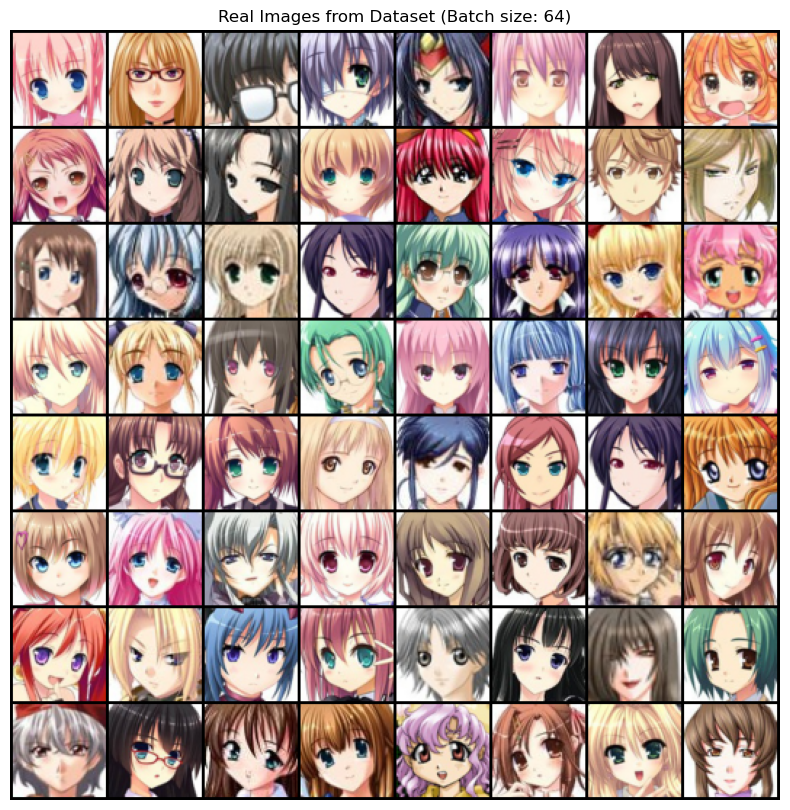

In [7]:
visualize_real_samples(dataloader, device)

## Теоретическое обоснование — от GAN к WGAN-GP

### Проблемы классических GAN


1.   **Vanishing gradients** — одна из главных проблем классических GAN, которая возникает в ситуации, когда дискриминатор становится слишком "сильным" и легко различает реальные и сгенерированные данные. В этом случае, градиенты генератора становятся слишком маленькими, что приводит к плохому обучению модели.

2.   **Mode collapse** — это проблема, при которой генератор начинает производить множество однотипных сэмплов, не используя всё разнообразие тренировочных данных, например, как показано на картинке ниже. Кстати, она сгенерирована той же архитетурой GAN, которая была показана на семинаре.

3. **Интерпретация лосса при обучении** - бинарная кросс-энтропия напрямую не измеряет расстояние между реальным и генерируемым распределениями, она лишь отражает способность дискриминатора различать реальные и фейковые данные. Если генератор производит плохие сэмплы, loss дискриминатора всё равно может уменьшаться, что создает ложное представление о прогрессе обучения.


### Решение: Wasserstein GAN (WGAN):

Первое, о чем стоит поговорить - это функция потерь. Дискриминатор классического GAN работает как бинарный классификатор, выдавая **вероятности** для реальных и фейковых данных на выходе. Поэтому в качестве функции потерь используется бинарная кросс-энтропия:

$L_{\text{discriminator}} = -\mathbb{E}_{x \sim p_{\text{data}}} [\log D(x)] - \mathbb{E}_{z \sim p_z} [\log(1 - D(G(z)))]$

$L_{\text{generator}} = -\mathbb{E}_{z \sim p_z} [\log D(G(z))]$


Именно здесь и кроятся основные проблемы GAN'ов, про которые мы говорили выше. Когда дискриминатор достигает идеальной точности ($D(x)\approx 1$ для реальных данных и $D(G(z))\approx 0$ для фейковых), производная лосса генератора $\mathbb{E}_{z \sim p_z} [\log D(G(z))]$ может стремиться к нулю. Это приводит к тому, что генератор перестаёт получать полезные сигналы для обучения (vanishing gradients). Также, такой лосс не учитывает разнообразие тренировочных данных, и генератор может находить локальный оптимум, где он производит один или несколько типов данных, которые легко обманывают дискриминатор (mode-collapse).


**Проблемы классических GAN:**
- Исчезающие градиенты: Сильный дискриминатор "забивает" градиенты генератора, останавливая обучение.

- Коллапс мод: Генератор производит ограниченное разнообразие образцов.

- Слабая интерпретируемость лосса: Значение функции потерь не отражает реальное качество генерации.

Идея модификации заключается в отказе от бинарной кросс-энтропии. Вместо этого в модели WGAN используется Wasserstein-расстояние.

$W(p_{\text{data}}, p_{\text{gen}}) = -L_{\text{critic}} = \sup_{\|C\|_L \leq 1} \left( \mathbb{E}_{x \sim p_{\text{data}}} [C(x)] - \mathbb{E}_{z \sim p_z} [C(G(z))] \right)$

$L_{\text{generator}} = -\mathbb{E}_{z \sim p_z} [C(G(z))]$

В теории WGAN'ов $C(x)$ обозначается то, что раньше мы называли дискриминатором $D(x)$. Теперь модель, которую пытается обмануть генератор, называется **"Критик" ("Critic")**. Главное отличие критика от дискриминатора заключается в том, что критик - не бинарный классификатор. **На выходе у критика не вероятности, а некоторая численная оценка**, для которой при обучении подсчитывается Wasserstein-расстояние. Также, в процессе обучения происходит клиппирование весов критика $\|C\|_L \leq 1$, чтобы сохранить его липшевость. **Во всем остальном критик и дискриминатор идентичны**.

Такой подход позволяет успешно бороться с проблемами классических GAN:

1.   **Mode-collapse**: Wasserstein-дистанция учитывает всю структуру распределений, что побуждает генератор создавать разнообразные образцы.
2.   **Vanishing gradients**:
Генератор всегда получает полезные сигналы для обучения, даже если он находится далеко от целевого распределения.
3. **Интерпретация лосса при обучении**: Wasserstein-дистанция является более естественной метрикой для сравнения распределений, чем бинарная кросс-энтропия. Она напрямую показывает, насколько одно распределение отличается от другого, поэтому в процессе обучения лосс должен монотонно уменьшаться.






Подведем итоги

|               | **Классический GAN**                          | **WGAN**                                    |
|--------------------------|-----------------------------------------------|------------------------------------------------|
| **Функция потерь**       | Бинарная кросс-энтропия                       | Wasserstein-дистанция      |
| **Выход модели**         | Вероятность \($ D(x) \in [0, 1] $ \)          | Скалярное значение \($ C(x) \in \mathbb{R} $\) |                           |
| **Стабильность обучения**| Нестабильное обучение                         | Гораздо более стабильное обучение               |
| **Mode collapse**         | Часто встречается                             | Реже встречается                               |
| **Поведение градиентов**     | Исчезающие градиенты (vanishing gradients)     | Постоянные и значимые градиенты                 |
| **Интерпретируемость**      | Loss сложно интерпретировать                   | Loss монотонно уменьшается                     |

Более подробно и математически строго про WGAN можно почитать в [оригинальной статье](https://arxiv.org/pdf/1701.07875).

## Архитектура моделей (Генератор и Критик)

Определяем архитектуры нейросетей. Генератор преобразует шумовой вектор в изображение 64x64x3. Критик (аналог дискриминатора) оценивает изображение и выдает скалярную оценку. Используются сверточные и транспонированные сверточные слои.

In [8]:
LATENT_SIZE = 128  # Размерность латентного пространства

In [9]:
# Генератор (Generator)
class Generator(nn.Module):
    """
    Генератор. Преобразует вектор шума (LATENT_DIM, 1, 1) в изображение (3, 64, 64).
    Использует последовательность транспонированных сверток (ConvTranspose2d) для апсемплинга.
    """
    def __init__(self, latent_size=LATENT_SIZE):
        super(Generator, self).__init__()

        self.model = nn.Sequential(
        # in: latent_size x 1 x 1
    
        nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
        nn.BatchNorm2d(512),
        nn.ReLU(True),
        # out: 512 x 4 x 4
    
        nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(256),
        nn.ReLU(True),
        # out: 256 x 8 x 8
    
        nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(128),
        nn.ReLU(True),
        # out: 128 x 16 x 16
    
        nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(64),
        nn.ReLU(True),
        # out: 64 x 32 x 32
    
        nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
        nn.Tanh()
        # out: 3 x 64 x 64
    )

    def forward(self, z):
        x = self.model(z)
        return x

In [10]:
# Критик (Critic)
class Critic(nn.Module):
    """
    Критик (в оригинальном WGAN) / Дискриминатор. Оценивает изображение (3, 64, 64) и выдает скаляр.
    В отличие от классического GAN, на выходе нет функции активации (например, Sigmoid).
    """
    def __init__(self):
        super(Critic, self).__init__()
        # архитектура та же, что GAN,
        # но на выходе вектор из скаляров, а не вектор вероятностей
        self.model = nn.Sequential(
        # in: 3 x 64 x 64
    
        nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
        nn.LeakyReLU(0.2, inplace=True),
        # out: 64 x 32 x 32
    
        nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
        nn.LeakyReLU(0.2, inplace=True),
        # out: 128 x 16 x 16
    
        nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
        nn.LeakyReLU(0.2, inplace=True),
        # out: 256 x 8 x 8
    
        nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
        nn.LeakyReLU(0.2, inplace=True),
        # out: 512 x 4 x 4
    
        nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
        # out: 1 x 1 x 1
    
        nn.Flatten() # Преобразует в (batch_size, 1)
        )

    def forward(self, img):
        return self.model(img)

In [11]:
# Инициализация моделей и перемещение на устройство
generator = Generator().to(device)
critic = Critic().to(device)

print("Generator architecture:")
print(generator)
print("\nCritic architecture:")
print(critic)

Generator architecture:
Generator(
  (model): Sequential(
    (0): ConvTranspose2d(128, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False

## Реализация функции градиентного штрафа (Gradient Penalty)

В WGAN критик $C(x)$ должен быть липшицевой функцией , то есть его производная должна быть ограничена:

$\|\nabla_{\hat{x}} C(\hat{x})\|_2 \leq 1$

Это требование необходимо для корректного вычисления Wasserstein-дистанции.

В оригинальном WGAN для обеспечения Липшицевости применяется клиппирование весов:

$w \in \[-c, c]\$,

где $w$ - параметры критика, а $c$ - некоторое маленькое число.

Однако такой подход слишком жестко ограничивает диапозон значений весов, что часто приводит к нестабильности обучения и плохой сходимости.

Альтернативой клиппирования является **градиентный штраф (Gradient Penalty)**, который представляет собой метод регуляризации весов, и добавляется в функцию потерь критика с некоторым коэффициентом $\lambda$:

$L_{\text{critic}} = -\mathbb{E}_{x \sim p_{\text{data}}} [C(x)] + \mathbb{E}_{z \sim p_z} [C(G(z))] + \lambda L_{\text{GP}}$

$L_{\text{GP}} = \mathbb{E}_{\hat{x} \sim P_{\hat{x}}} \left[ (\|\nabla_{\hat{x}} C(\hat{x})\|_2 - 1)^2 \right]$





**Как это работает?**


1) Создается интерполяция между реальными ($x_{real}$) и фейковыми ($x_{fake}$) данными

$\hat{x} = \alpha x_{\text{real}} + (1 - \alpha) x_{\text{fake}}$,

где $\alpha$ сэмплируется из равномерного распределения $\alpha \sim U(0, 1).$

2) Вычисляется норма градиента критика по интерполированным данным:

$\|\nabla_{\hat{x}} C(\hat{x})\|_2$

3) Добавляется штраф за отклонение нормы градиента от 1 и усредняется по всем интерполированным точкам

$L_{\text{GP}} = \mathbb{E}_{\hat{x} \sim P_{\hat{x}}} \left[ (\|\nabla_{\hat{x}} C(\hat{x})\|_2 - 1)^2 \right]$

Более подробно о градиентном штрафе можно почитать в [оригинальной статье](https://arxiv.org/pdf/1704.00028).

 Это ключевой компонент WGAN-GP. Функция вычисляет штраф за отклонение нормы градиента критика (взятый в случайных точках на прямых между реальными и сгенерированными данными) от 1. Это мягко обеспечивает условие Липшицевости.

### Напишите функцию для вычисления градиентного штрафа $L_{\text{GP}}$ (2 балла)

In [12]:
def compute_gradient_penalty(critic, real_samples, fake_samples, device):
    """
    Вычисляет градиентный штраф для WGAN-GP.

    Args:
        critic: Модель критика.
        real_images: Тензор с реальными изображениями.
        fake_images: Тензор с фейковыми изображениями.
        :param device: Устройство для вычислений CPU/GPU.
        Градиентный штраф

    Returns:
        gradient_penalty: Значение градиентного штрафа (скаляр).
    """

    # Создаем интерполированные данные:, используйте torch.rand для сэмплирования alpha.
    #x_hat = alpha * real + (1 - epsilon) * fake
    alpha = torch.rand(real_samples.size(0), 1, 1, 1, device=device) # Случайный коэффициент для каждого элемента батча
    x_hat = alpha * real_samples + (1 - alpha) * fake_samples
    x_hat = x_hat.requires_grad_(True)

    # Прогоняем интерполированные данные через критика
    critic_interpolates = critic(x_hat)

    # Вычисляем градиенты выхода критика по входным данным (x_hat)
    # Необходимо создать граф вычислений (create_graph=True) для последующего backward()
    gradients = torch.autograd.grad(
        outputs=critic_interpolates,
        inputs=x_hat,
        grad_outputs=torch.ones_like(critic_interpolates, device=device), # Градиент потерь - единицы
        create_graph=True,
        retain_graph=True,
        only_inputs=True
    )[0]  # gradients shape: (batch_size, 3, 64, 64)

    # Вычисляем L2 норму градиентов для каждого примера в батче
    gradients = gradients.view(gradients.size(0), -1)
    gradient_norm = gradients.norm(2, dim=1)

    # Штраф: средний квадрат отклонения нормы от 1
    gradient_penalty = ((gradient_norm - 1) ** 2).mean()

    return gradient_penalty

### Вспомогательные функции для визуализации процесса обучения

In [13]:
# from tqdm import tqdm

# def show_generated_images(generator, latent_size, device, num_images=5):
#     """Выводит сгенерированные изображения."""
#     generator.eval()
#     with torch.no_grad():
#         # обратите внимание на размерность сгенированных векторов
#         z = torch.randn(num_images, latent_size, 1, 1, device=device)
#         generated_images = generator(z).cpu()  # Генерируем изображения

#     # Нормализация значений пикселей для отображения
#     generated_images = (generated_images + 1) / 2.0  # Из диапазона [-1, 1] в [0, 1]

#     # Визуализация
#     plt.figure(figsize=(8, 8))
#     plt.axis("off")
#     plt.imshow(np.transpose(
#         vutils.make_grid(
#             generated_images,
#             padding=2,
#             normalize=True
#             ).cpu(),
#          (1, 2, 0)))
#     plt.show();

#     generator.train()

In [14]:
def generate_and_save_images(generator: nn.Module,
                             epoch: int,
                             latent_dim: int,
                             device: torch.device,
                             num_images: int = 25,
                             save_path: str = "./generated_images"):
    """
    Генерирует изображения с помощью генератора и сохраняет их в виде сетки.

    Аргументы:
        generator: Обученная модель генератора.
        epoch: Номер текущей эпохи (для имени файла).
        latent_dim: Размерность латентного пространства.
        device: Устройство для вычислений.
        num_images: Количество изображений для генерации.
        save_path: Путь для сохранения изображений.
    """
    if not os.path.exists(save_path):
        os.makedirs(save_path)

    generator.eval()  # Переключаем генератор в режим оценки
    with torch.no_grad():  # Отключаем вычисление градиентов для ускорения
        # Генерируем случайный шум
        z = torch.randn(num_images, latent_dim, 1, 1, device=device)
        # Получаем сгенерированные изображения
        generated_imgs = generator(z).cpu()

    # Денормализуем изображения из [-1, 1] в [0, 1] для сохранения
    generated_imgs = (generated_imgs + 1) / 2.0

    # Создаем сетку изображений
    grid = make_grid(generated_imgs, nrow=5, padding=2, normalize=False)

    # Сохраняем сетку
    save_image(grid, os.path.join(save_path, f"epoch_{epoch:03d}.png"))

    # Визуализируем в ноутбуке
    plt.figure(figsize=(10, 10))
    plt.imshow(grid.permute(1, 2, 0).numpy())
    plt.axis("off")
    plt.title(f"Generated Images at Epoch {epoch}")
    plt.show()

    generator.train()  # Возвращаем генератор в режим обучения


def plot_training_losses(g_losses: list, c_losses: list, window_size: int = 100):
    """
    Строит графики лоссов генератора и критика в процессе обучения.

    Аргументы:
        g_losses: Список значений лосса генератора на каждом шаге.
        c_losses: Список значений лосса критика на каждом шаге.
        window_size: Размер окна для скользящего среднего (для сглаживания графиков).
    """
    plt.figure(figsize=(12, 6))

    # Вычисляем скользящее среднее для сглаживания
    def moving_average(data, window):
        return np.convolve(data, np.ones(window)/window, mode='valid')

    smoothed_g_losses = moving_average(g_losses, window_size)
    smoothed_c_losses = moving_average(c_losses, window_size)

    # Строим графики
    plt.subplot(1, 2, 1)
    plt.plot(g_losses, alpha=0.3, label='Raw', color='blue')
    plt.plot(range(window_size-1, len(g_losses)), smoothed_g_losses, label=f'Smoothed (window={window_size})', color='blue', linewidth=2)
    plt.xlabel("Training Step")
    plt.ylabel("Generator Loss")
    plt.title("Generator Loss during Training")
    plt.legend()
    plt.grid(True, alpha=0.3)

    plt.subplot(1, 2, 2)
    plt.plot(c_losses, alpha=0.3, label='Raw', color='red')
    plt.plot(range(window_size-1, len(c_losses)), smoothed_c_losses, label=f'Smoothed (window={window_size})', color='red', linewidth=2)
    plt.xlabel("Training Step")
    plt.ylabel("Critic Loss")
    plt.title("Critic Loss during Training")
    plt.legend()
    plt.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

### Цикл обучения WGAN-GP
Основная функция обучения. Реализует алгоритм WGAN-GP с обновлением критика несколько раз на каждое обновление генератора (n_critic). Включает расчет лоссов с градиентным штрафом и логирование прогресса.

In [15]:
def train_wgan_gp(dataloader: DataLoader,
                  generator: nn.Module,
                  critic: nn.Module,
                  optimizer_G: optim.Optimizer,
                  optimizer_C: optim.Optimizer,
                  epochs: int,
                  latent_dim: int,
                  lambda_gp: float,
                  n_critic: int,
                  device: torch.device,
                  sample_interval: int = 5):
    """
    Обучает модель WGAN-GP.

    Аргументы:
        dataloader: DataLoader с тренировочными данными.
        generator: Модель генератора.
        critic: Модель критика.
        optimizer_G: Оптимизатор для генератора.
        optimizer_C: Оптимизатор для критика.
        epochs: Количество эпох обучения.
        latent_dim: Размерность латентного пространства.
        lambda_gp: Коэффициент градиентного штрафа.
        n_critic: Количество итераций обучения критика на одну итерацию генератора.
        device: Устройство для вычислений.
        sample_interval: Интервал (в эпохах) для сохранения сгенерированных изображений.

    Возвращает:
        tuple: (g_losses, c_losses) - списки лоссов на каждом шаге.
    """
    g_losses = []
    c_losses = []

    for epoch in range(epochs):
        epoch_g_loss = 0.0
        epoch_c_loss = 0.0
        progress_bar = tqdm(dataloader, desc=f"Epoch {epoch+1}/{epochs}", leave=False)

        for batch_idx, (real_imgs, _) in enumerate(progress_bar):
            real_imgs = real_imgs.to(device)
            batch_size = real_imgs.size(0)

            # ---------------------
            #  Обучение критика (Critic)
            # ---------------------
            optimizer_C.zero_grad()

            # Генерируем фейковые изображения
            z = torch.randn(batch_size, latent_dim, 1, 1, device=device)
            fake_imgs = generator(z).detach()  # detach, чтобы не считать градиенты для генератора

            # Вычисляем лосс критика: -E[C(real)] + E[C(fake)] + λ * GP
            real_scores = critic(real_imgs)
            fake_scores = critic(fake_imgs)

            real_loss = -torch.mean(real_scores)
            fake_loss = torch.mean(fake_scores)

            # Вычисляем градиентный штраф
            gradient_penalty = compute_gradient_penalty(critic, real_imgs, fake_imgs, device)

            # Итоговый лосс критика
            c_loss = real_loss + fake_loss + lambda_gp * gradient_penalty

            c_loss.backward()
            optimizer_C.step()

            # ---------------------
            #  Обучение генератора (Generator)
            # ---------------------
            # Обновляем генератор только каждый n_critic-ый шаг
            if batch_idx % n_critic == 0:
                optimizer_G.zero_grad()

                # Генерируем новые фейковые изображения
                z = torch.randn(batch_size, latent_dim, 1, 1, device=device)
                gen_imgs = generator(z)

                # Лосс генератора: -E[C(G(z))]
                g_loss = -torch.mean(critic(gen_imgs))

                g_loss.backward()
                optimizer_G.step()

                # Сохраняем лосс генератора
                g_losses.append(g_loss.item())
                epoch_g_loss += g_loss.item()

            # Сохраняем лосс критика (на каждом шаге)
            c_losses.append(c_loss.item())
            epoch_c_loss += c_loss.item()

            # Обновляем прогресс-бар
            progress_bar.set_postfix({
                "C_loss": c_loss.item(),
                "G_loss": g_loss.item() if batch_idx % n_critic == 0 else "---"
            })

        # Выводим статистику по эпохе
        avg_g_loss = epoch_g_loss / (len(dataloader) // n_critic)
        avg_c_loss = epoch_c_loss / len(dataloader)
        print(f"Epoch [{epoch+1}/{epochs}] | Avg C_loss: {avg_c_loss:.4f} | Avg G_loss: {avg_g_loss:.4f}")

        # Генерируем и сохраняем изображения с заданным интервалом
        if (epoch + 1) % sample_interval == 0 or epoch == 0:
            generate_and_save_images(generator, epoch+1, latent_dim, device)

    print("Training completed!")
    return g_losses, c_losses

## Обучение WGAN-GP

Задаем гиперпараметры, создаем оптимизаторы и запускаем процесс обучения. Гиперпараметры выбраны на основе рекомендаций из оригинальной статьи WGAN-GP и практики.

Starting WGAN-GP Training...
Hyperparameters: Epochs=50, LR=0.0001, λ_GP=10, n_critic=5


Epoch 1/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [1/50] | Avg C_loss: -43.4884 | Avg G_loss: 12.2936


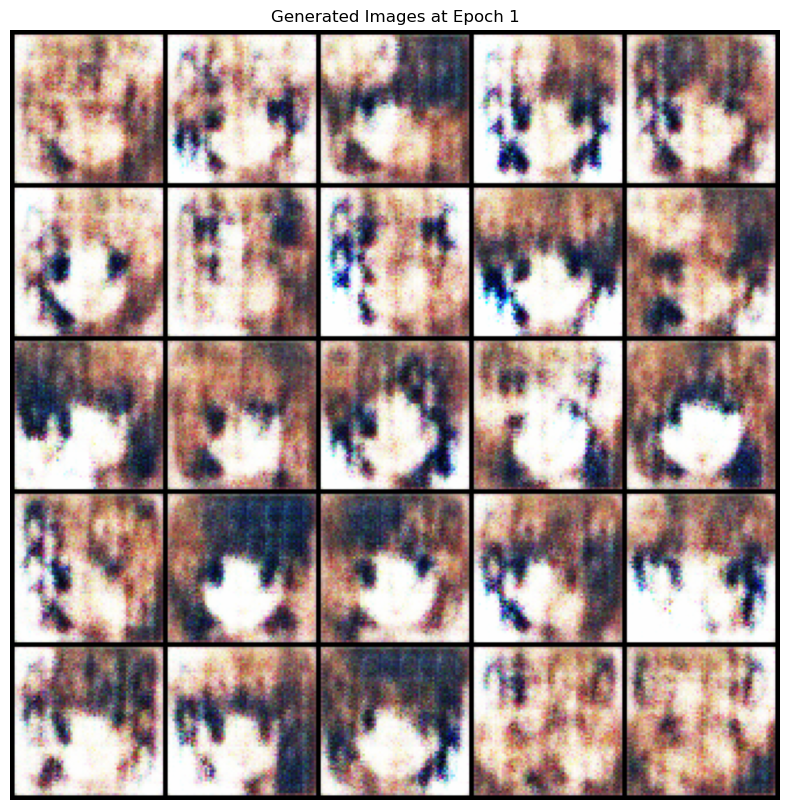

Epoch 2/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [2/50] | Avg C_loss: -18.0043 | Avg G_loss: 4.1589


Epoch 3/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [3/50] | Avg C_loss: -12.5779 | Avg G_loss: 1.6072


Epoch 4/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [4/50] | Avg C_loss: -9.7143 | Avg G_loss: -0.5854


Epoch 5/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [5/50] | Avg C_loss: -8.8763 | Avg G_loss: 0.2950


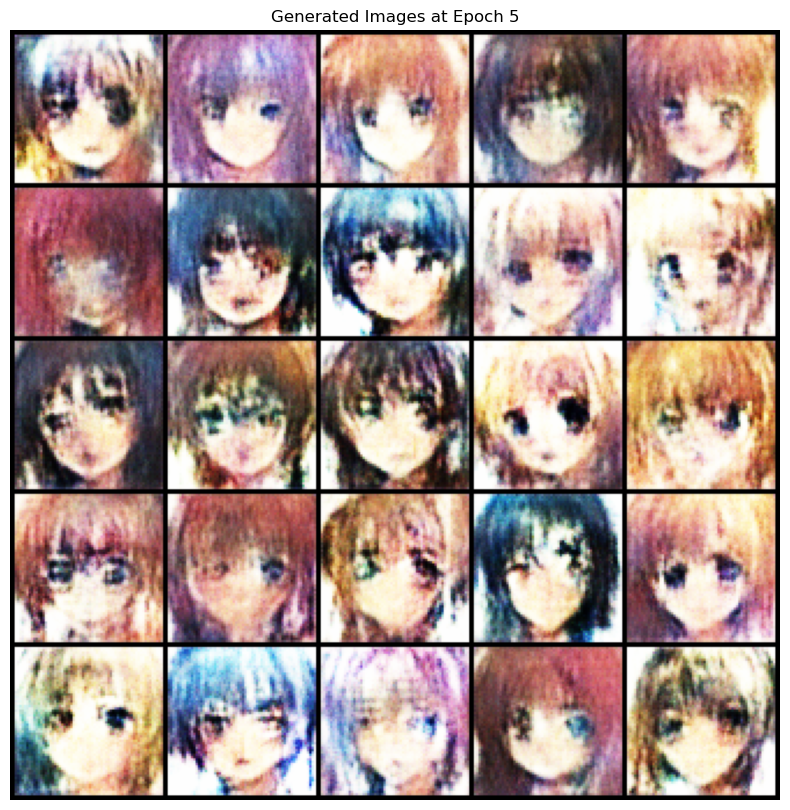

Epoch 6/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [6/50] | Avg C_loss: -8.7513 | Avg G_loss: 0.9294


Epoch 7/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [7/50] | Avg C_loss: -8.6275 | Avg G_loss: 1.1438


Epoch 8/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [8/50] | Avg C_loss: -8.4051 | Avg G_loss: 1.2231


Epoch 9/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [9/50] | Avg C_loss: -8.0697 | Avg G_loss: 1.5498


Epoch 10/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [10/50] | Avg C_loss: -7.7241 | Avg G_loss: 1.4955


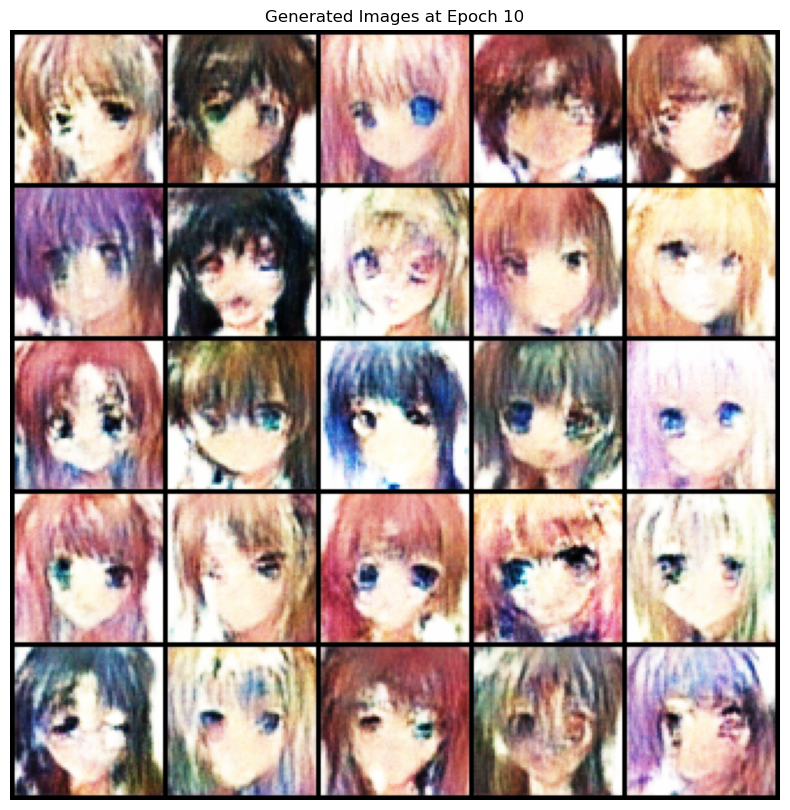

Epoch 11/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [11/50] | Avg C_loss: -7.3527 | Avg G_loss: 1.5097


Epoch 12/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [12/50] | Avg C_loss: -7.0096 | Avg G_loss: 1.4396


Epoch 13/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [13/50] | Avg C_loss: -6.7369 | Avg G_loss: 1.3799


Epoch 14/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [14/50] | Avg C_loss: -6.5241 | Avg G_loss: 1.2902


Epoch 15/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [15/50] | Avg C_loss: -6.3357 | Avg G_loss: 1.2217


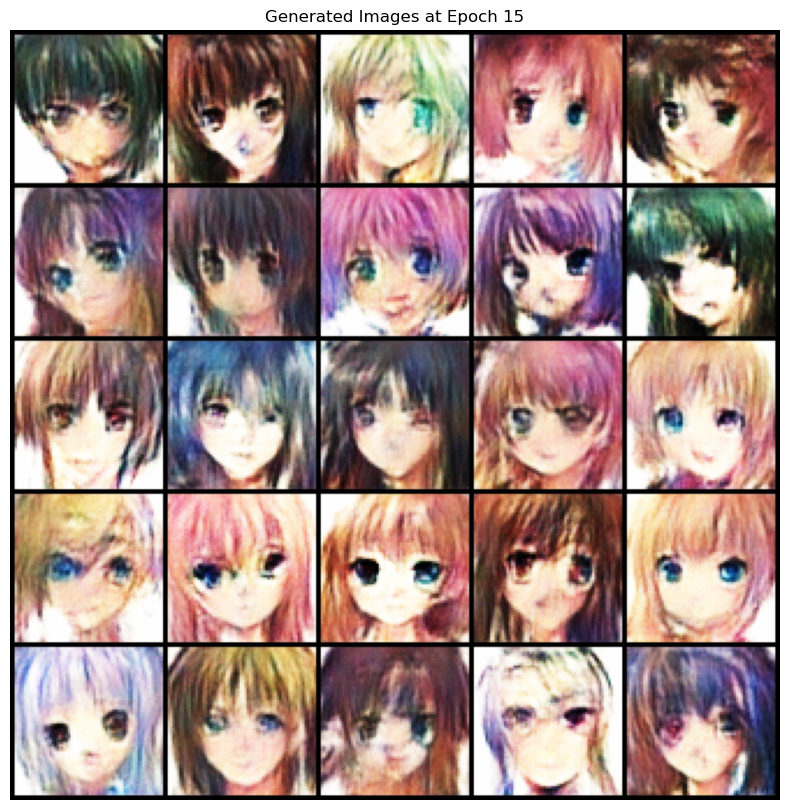

Epoch 16/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [16/50] | Avg C_loss: -6.1990 | Avg G_loss: 1.0913


Epoch 17/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [17/50] | Avg C_loss: -6.0928 | Avg G_loss: 0.9306


Epoch 18/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [18/50] | Avg C_loss: -6.0065 | Avg G_loss: 0.9967


Epoch 19/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [19/50] | Avg C_loss: -5.9132 | Avg G_loss: 0.8799


Epoch 20/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [20/50] | Avg C_loss: -5.8449 | Avg G_loss: 0.7791


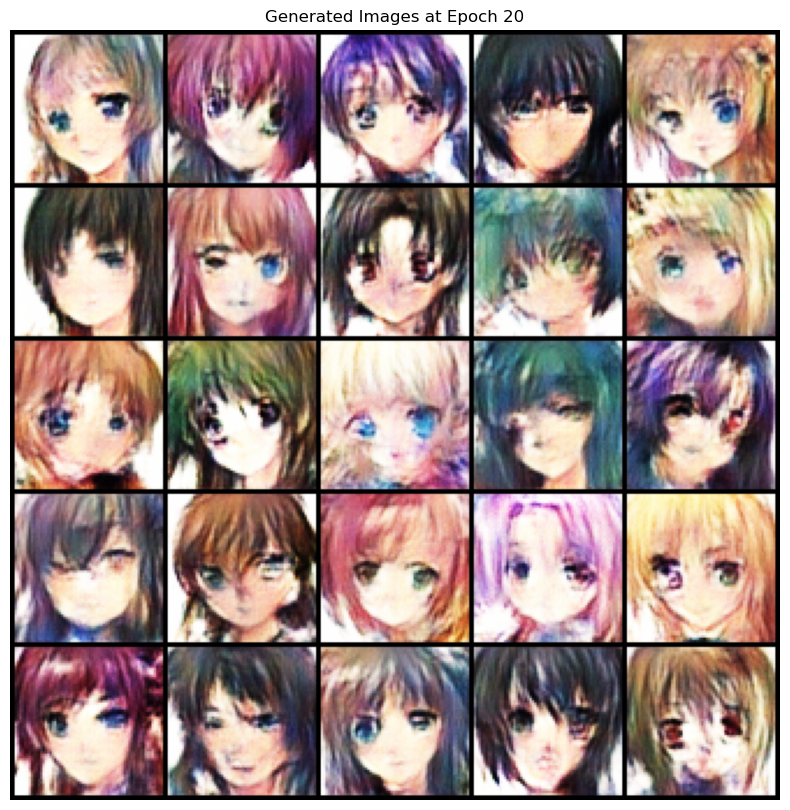

Epoch 21/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [21/50] | Avg C_loss: -5.7851 | Avg G_loss: 0.7518


Epoch 22/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [22/50] | Avg C_loss: -5.7318 | Avg G_loss: 0.7859


Epoch 23/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [23/50] | Avg C_loss: -5.6530 | Avg G_loss: 0.7080


Epoch 24/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [24/50] | Avg C_loss: -5.5929 | Avg G_loss: 0.6247


Epoch 25/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [25/50] | Avg C_loss: -5.5214 | Avg G_loss: 0.6407


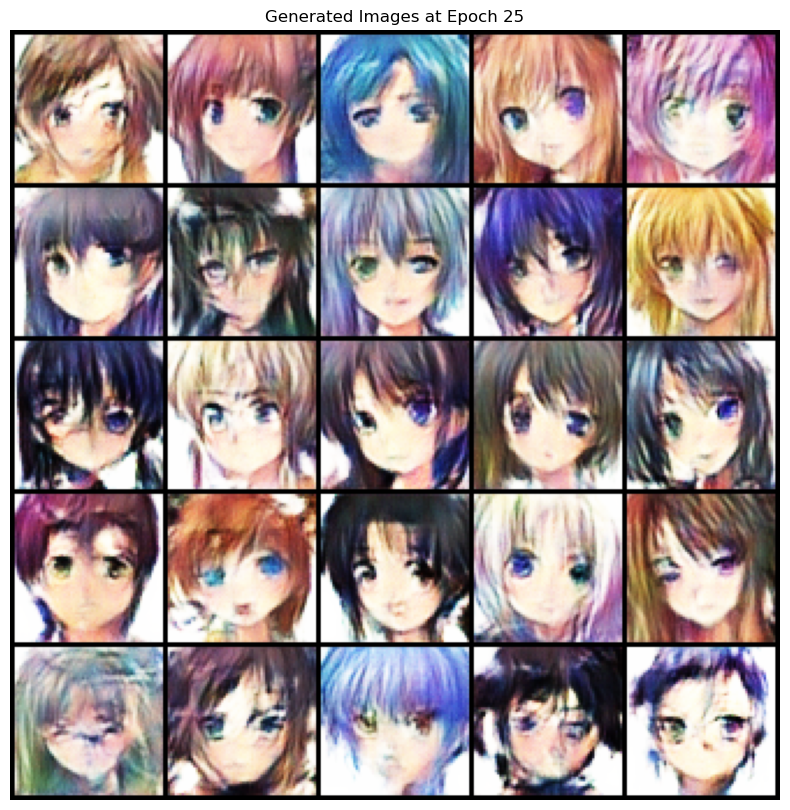

Epoch 26/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [26/50] | Avg C_loss: -5.4440 | Avg G_loss: 0.6497


Epoch 27/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [27/50] | Avg C_loss: -5.3874 | Avg G_loss: 0.5355


Epoch 28/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [28/50] | Avg C_loss: -5.3252 | Avg G_loss: 0.5303


Epoch 29/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [29/50] | Avg C_loss: -5.2695 | Avg G_loss: 0.5414


Epoch 30/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [30/50] | Avg C_loss: -5.2065 | Avg G_loss: 0.4847


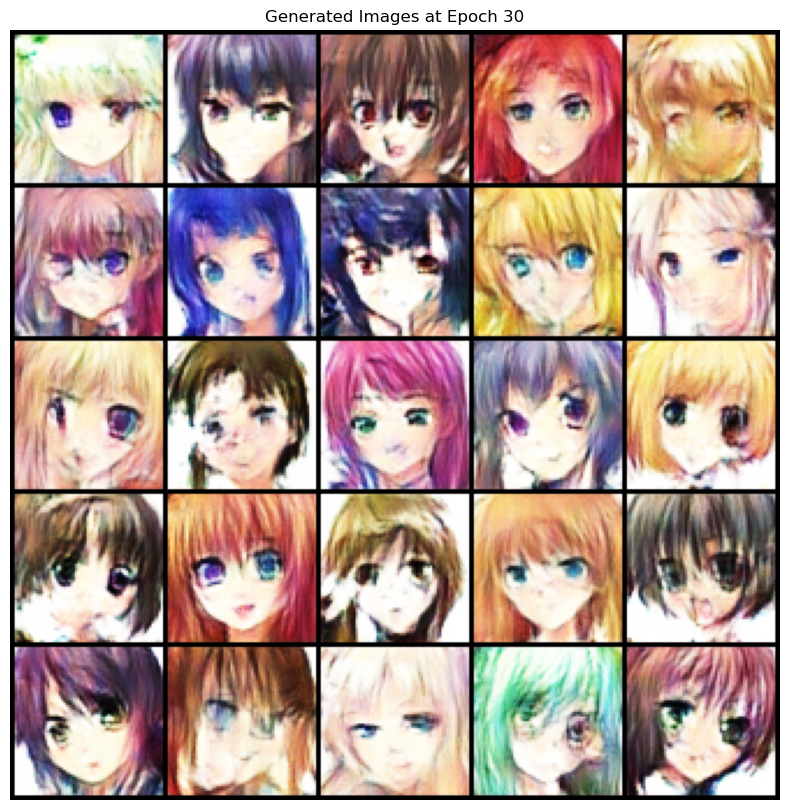

Epoch 31/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [31/50] | Avg C_loss: -5.1464 | Avg G_loss: 0.5585


Epoch 32/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [32/50] | Avg C_loss: -5.0848 | Avg G_loss: 0.3930


Epoch 33/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [33/50] | Avg C_loss: -5.0419 | Avg G_loss: 0.5301


Epoch 34/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [34/50] | Avg C_loss: -4.9873 | Avg G_loss: 0.4792


Epoch 35/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [35/50] | Avg C_loss: -4.9463 | Avg G_loss: 0.5135


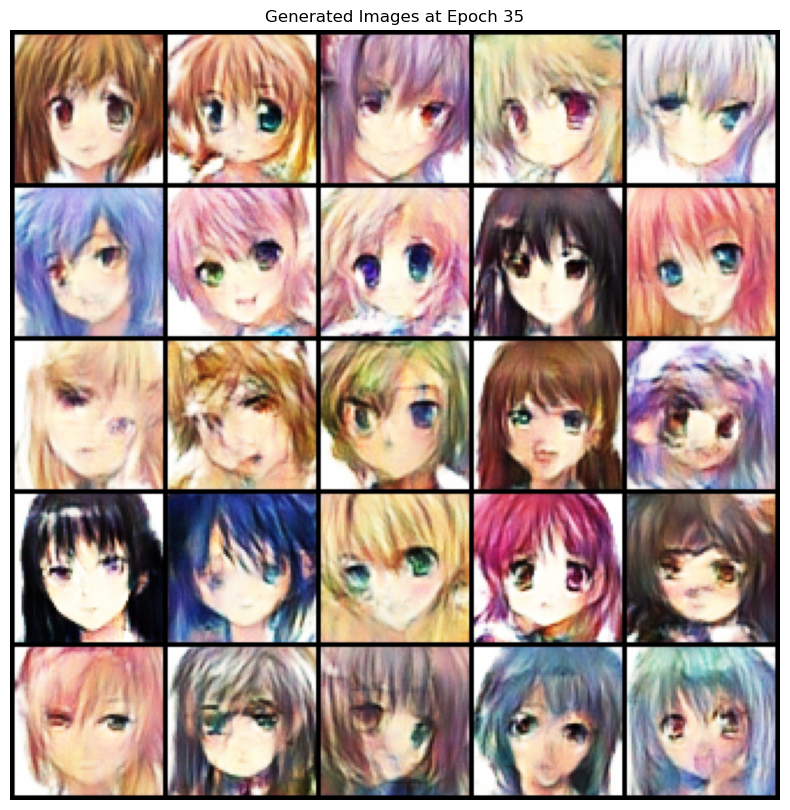

Epoch 36/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [36/50] | Avg C_loss: -4.9073 | Avg G_loss: 0.5413


Epoch 37/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [37/50] | Avg C_loss: -4.8840 | Avg G_loss: 0.5301


Epoch 38/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [38/50] | Avg C_loss: -4.8447 | Avg G_loss: 0.4721


Epoch 39/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [39/50] | Avg C_loss: -4.8115 | Avg G_loss: 0.4955


Epoch 40/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [40/50] | Avg C_loss: -4.7728 | Avg G_loss: 0.4932


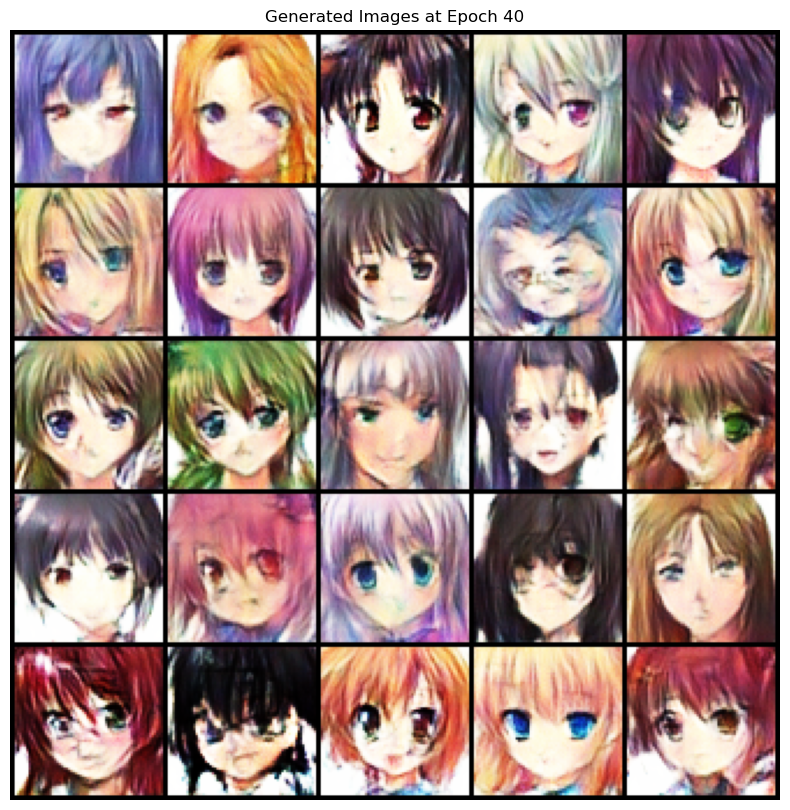

Epoch 41/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [41/50] | Avg C_loss: -4.7353 | Avg G_loss: 0.4659


Epoch 42/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [42/50] | Avg C_loss: -4.7117 | Avg G_loss: 0.5265


Epoch 43/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [43/50] | Avg C_loss: -4.6714 | Avg G_loss: 0.5289


Epoch 44/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [44/50] | Avg C_loss: -4.6504 | Avg G_loss: 0.3837


Epoch 45/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [45/50] | Avg C_loss: -4.6223 | Avg G_loss: 0.4778


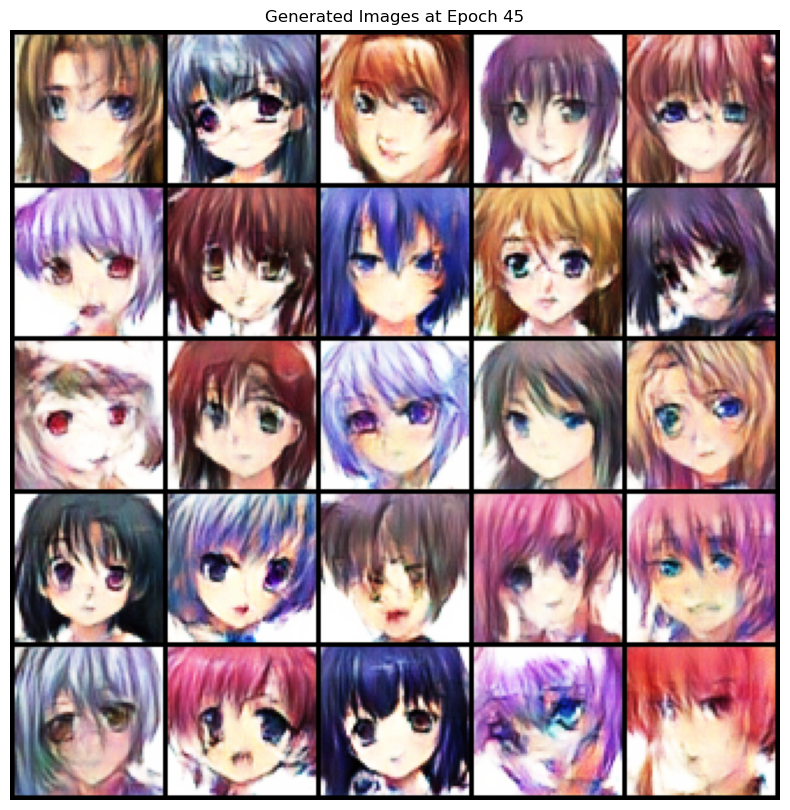

Epoch 46/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [46/50] | Avg C_loss: -4.5882 | Avg G_loss: 0.5122


Epoch 47/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [47/50] | Avg C_loss: -4.5687 | Avg G_loss: 0.4497


Epoch 48/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [48/50] | Avg C_loss: -4.5432 | Avg G_loss: 0.4687


Epoch 49/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [49/50] | Avg C_loss: -4.5203 | Avg G_loss: 0.4393


Epoch 50/50:   0%|          | 0/994 [00:00<?, ?it/s]

Epoch [50/50] | Avg C_loss: -4.5017 | Avg G_loss: 0.4509


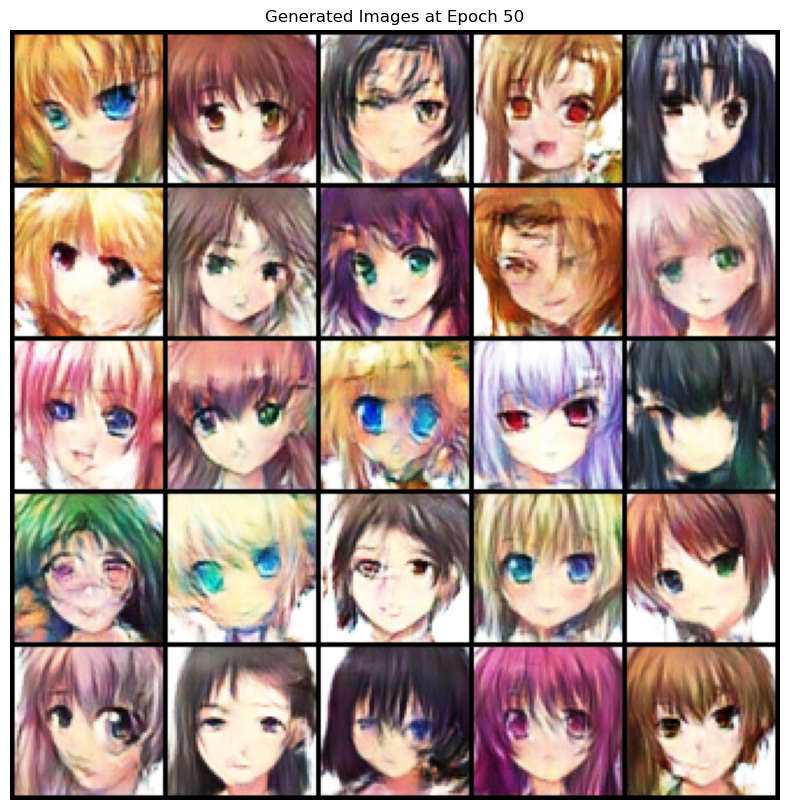

Training completed!


In [16]:
# Гиперпараметры
EPOCHS = 50
LEARNING_RATE = 1e-4
LATENT_DIM = 128
BATCH_SIZE = 64
N_CRITIC = 5  # Количество итераций критика на одну итерацию генератора
LAMBDA_GP = 10  # Коэффициент градиентного штрафа

# Инициализация моделей (уже созданы ранее)
generator = Generator(LATENT_DIM).to(device)
critic = Critic().to(device)

# Оптимизаторы. Используем Adam с beta1=0.0, beta2=0.9 как рекомендовано в статье WGAN-GP.
optimizer_G = optim.Adam(generator.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.9))
optimizer_C = optim.Adam(critic.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.9))

print("Starting WGAN-GP Training...")
print(f"Hyperparameters: Epochs={EPOCHS}, LR={LEARNING_RATE}, λ_GP={LAMBDA_GP}, n_critic={N_CRITIC}")

# Запуск обучения
g_losses, c_losses = train_wgan_gp(
    dataloader=dataloader,
    generator=generator,
    critic=critic,
    optimizer_G=optimizer_G,
    optimizer_C=optimizer_C,
    epochs=EPOCHS,
    latent_dim=LATENT_SIZE,
    lambda_gp=LAMBDA_GP,
    n_critic=N_CRITIC,
    device=device,
    sample_interval=5  # Сохранять изображения каждые 5 эпох
)

### Анализ результатов обучения

Визуализируем графики лоссов и финальные сгенерированные изображения. Анализируем, насколько обучение было стабильным и качественным.

Plotting training losses...


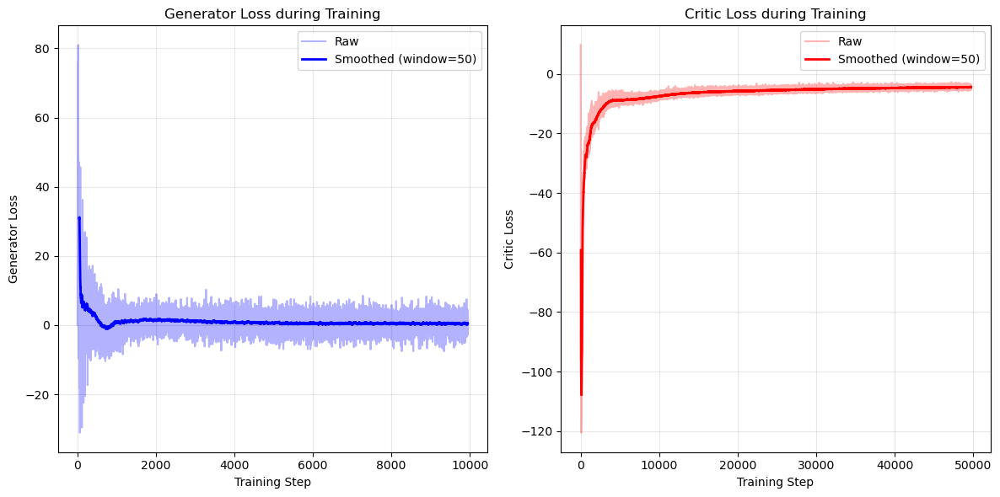


Generating final images...


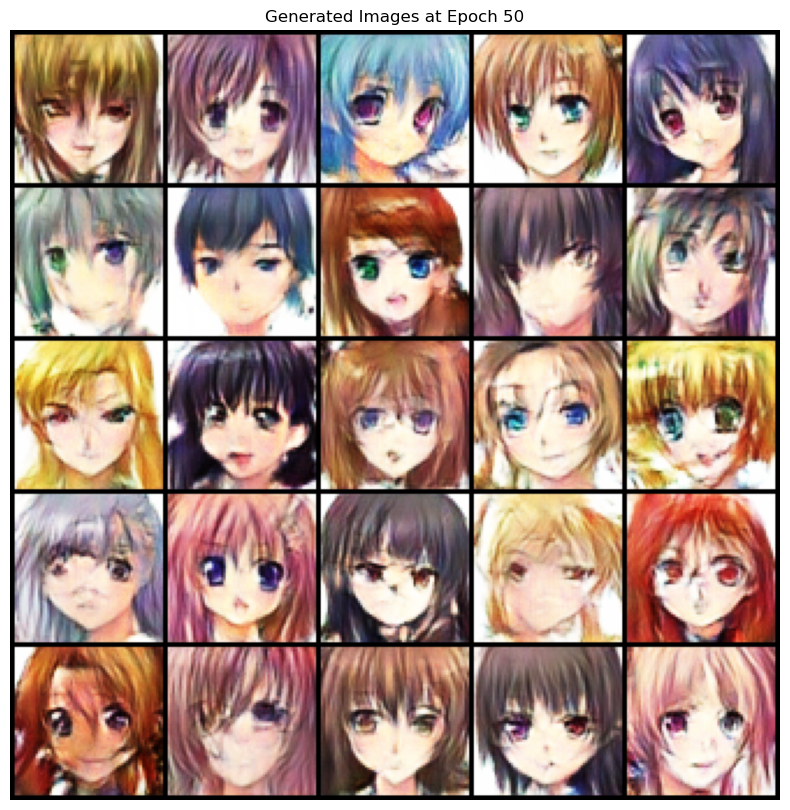


АНАЛИЗ РЕЗУЛЬТАТОВ
1. Стабильность обучения:
   - Лосс генератора колеблется вокруг значения: 0.464
   - Лосс критика колеблется вокруг значения: -4.443
   - Разность лоссов (примерная Wasserstein distance): -4.907
Признаков коллапса мод не обнаружено.


In [28]:
# 1. Графики лоссов
print("Plotting training losses...")
plot_training_losses(g_losses, c_losses, window_size=50)

# 2. Генерация финальных изображений
print("\nGenerating final images...")
generate_and_save_images(generator, EPOCHS, LATENT_DIM, device, num_images=25)

# 3. Анализ (текстовый вывод)
print("\n" + "="*50)
print("АНАЛИЗ РЕЗУЛЬТАТОВ")
print("="*50)

# Анализ лоссов
if len(g_losses) > 0 and len(c_losses) > 0:
    print(f"1. Стабильность обучения:")
    print(f"   - Лосс генератора колеблется вокруг значения: {np.mean(g_losses[-100:]):.3f}")
    print(f"   - Лосс критика колеблется вокруг значения: {np.mean(c_losses[-100:]):.3f}")
    print(f"   - Разность лоссов (примерная Wasserstein distance): {np.mean(c_losses[-100:]) - np.mean(g_losses[-100:]):.3f}")

    # Проверка на коллапс мод: если лосс генератора резко упал и не восстанавливается
    if np.std(g_losses[-50:]) < 0.5:
        print(f"Возможный признак коллапса мод: низкая вариативность лосса генератора.")
    else:
        print(f"Признаков коллапса мод не обнаружено.")


Прокомментируйте получившийся результат:
По группировкам точек можно сказать, что визуально они распределеяются на +-похожие кластеры. 

## Выводы

- Модель может генерировать картинки "удовлетворительного" качества. Контуры лиц четкие. Эмоции узнаваемые. Местоположение глаз и рта правильное. Артефакты присутствуют. Вероятно, если еще поработать над моделью, то получится улучшить результат.
- Сами картинки получаются разнообразными. Разные прически, цвета волос, эмоции.
